# ScVelo Analysis of the Chromaffin Data

The following codes are from [scVelo's main page](https://scvelo.readthedocs.io/en/stable/VelocityBasics.html), but I still used the data from the velocyto article.

In [1]:
import scvelo as scv
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import numpy as np

In [2]:
scv.logging.print_version()

Running scvelo 0.3.2 (python 3.10.8) on 2024-05-30 11:28.


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


Presets for scVelo plotting and analysis parameters.

In [3]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo', figsize=(5,5))  # for beautified visualization

In [4]:
adata = scv.read("../data/chromaffin_split.loom", cache = True)
adata_celltypist = adata.copy()

Proportions of spliced and unspliced data.

saving figure to file ./figures/scvelo_proportions_piechart_proportions.png


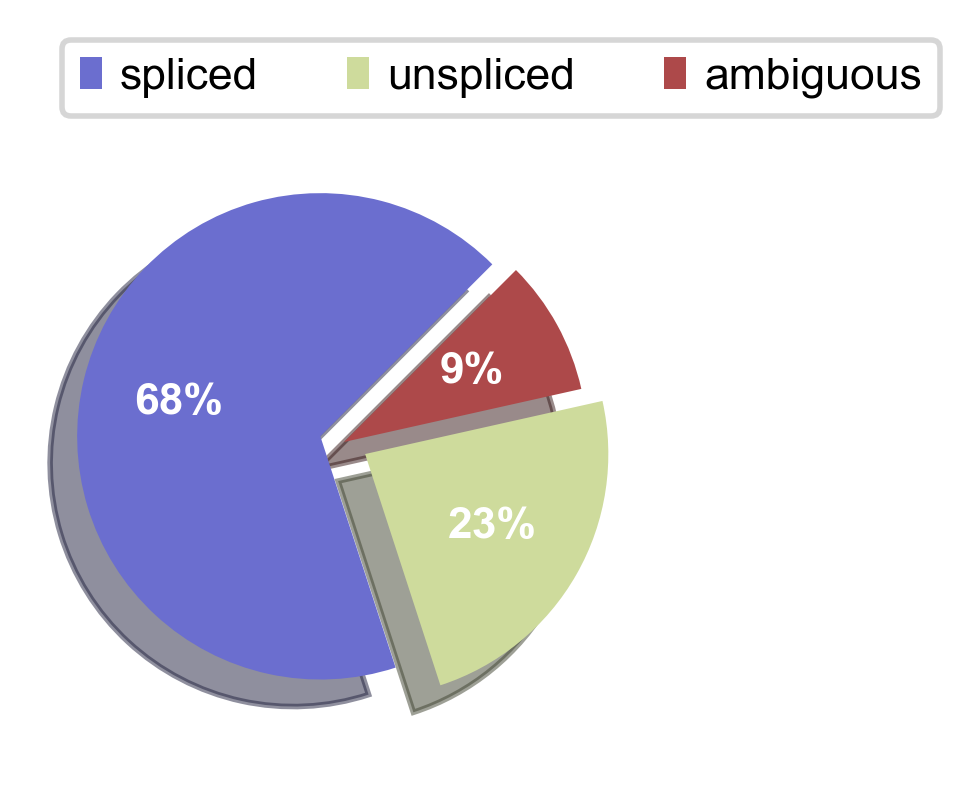

In [5]:
scv.pl.proportions(adata, save="piechart_proportions.png", dpi=200)

Data normalization.

In [6]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata)
scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
sc.pp.log1p(adata) # removed scv.pp.log1p(data) after a certain version of scvelo, used scanpy's pp.log1p instead

Filtered out 41992 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


Neighbor determination and clustering.

In [7]:
sc.pp.pca(adata)
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=30) # merge nearby cells into one neighborhood
scv.pp.moments(adata, n_pcs=None, n_neighbors=None)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


p.s. Directly running the codes from the page in this form:
```python
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
```
Will lead to an error:
```
TypeError: Neighbors.compute_neighbors() got an unexpected keyword argument 'write_knn_indices'
```

A suggested solution (for now) was found on this [Github issue](https://github.com/theislab/scvelo/issues/1212), which is the code above.

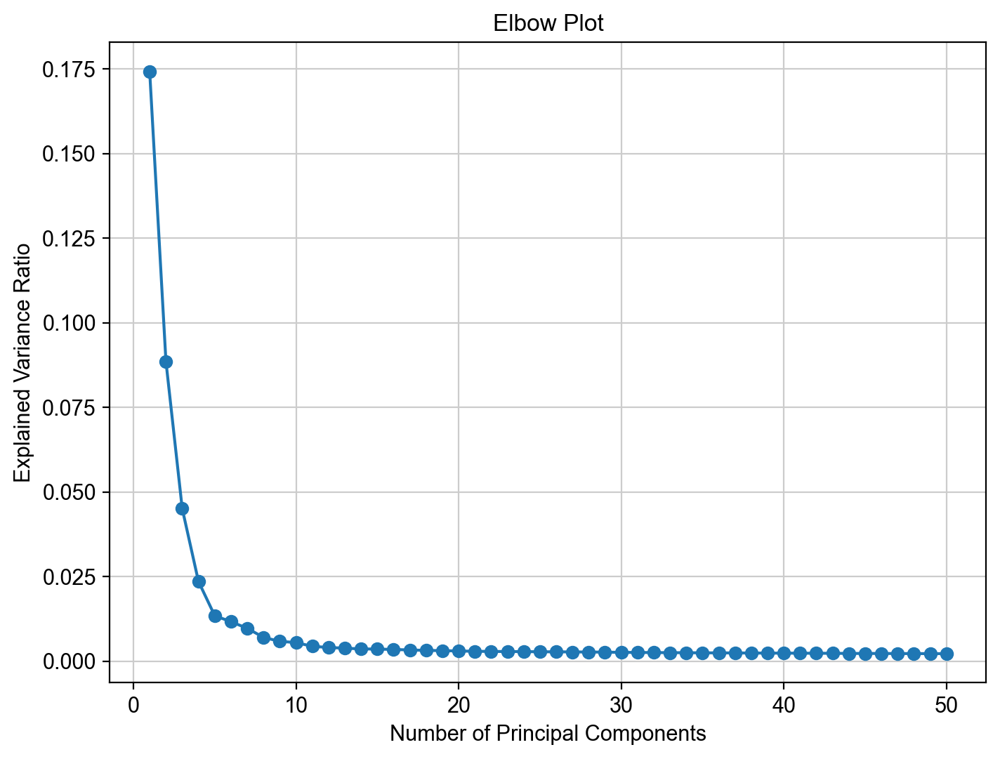

In [8]:
explained_variance_ratio = adata.uns['pca']['variance_ratio']

# Plot the elbow plot
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Elbow Plot')
plt.grid(True)
plt.show()

In [9]:
scv.tl.velocity(adata)
# Not dynamical

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [10]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/10 cores)


  0%|          | 0/767 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [11]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution = 0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution = 0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution = 1)

In [12]:
sc.tl.umap(adata)
print(adata.obsm.keys)
print(adata.obs.columns)
sc.tl.leiden(adata)
print(adata.obs.columns)

<bound method Mapping.keys of AxisArrays with keys: X_pca, X_umap>
Index(['initial_size_unspliced', 'initial_size_spliced', 'initial_size',
       'n_counts', 'velocity_self_transition', 'leiden_res0_25',
       'leiden_res0_5', 'leiden_res1'],
      dtype='object')
Index(['initial_size_unspliced', 'initial_size_spliced', 'initial_size',
       'n_counts', 'velocity_self_transition', 'leiden_res0_25',
       'leiden_res0_5', 'leiden_res1', 'leiden'],
      dtype='object')


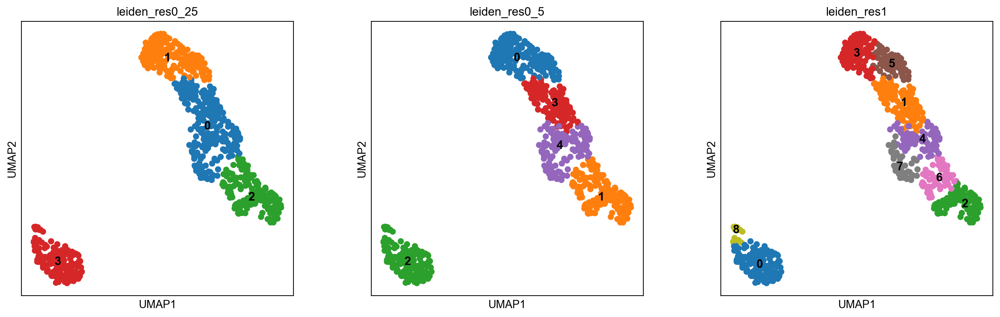

In [13]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"],
    legend_loc="on data",
    save="leiden_resolutions.png",
)

In [14]:
adata

AnnData object with n_obs × n_vars = 767 × 2000
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'umap', 'leiden', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spanning', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

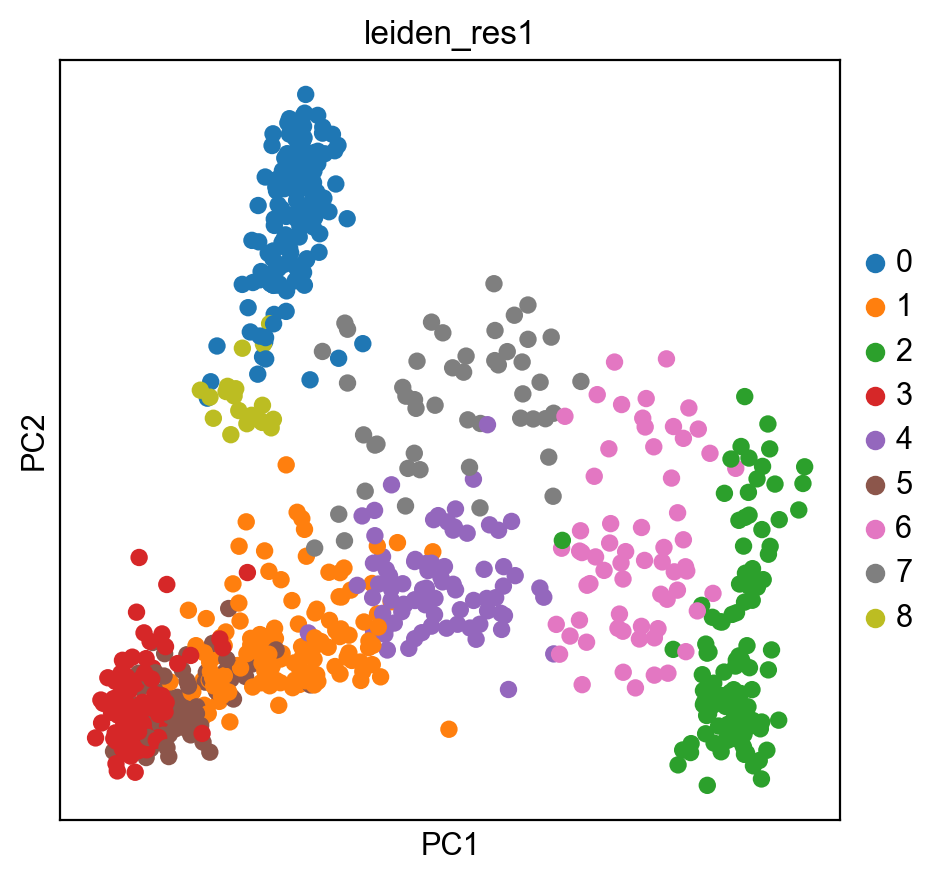

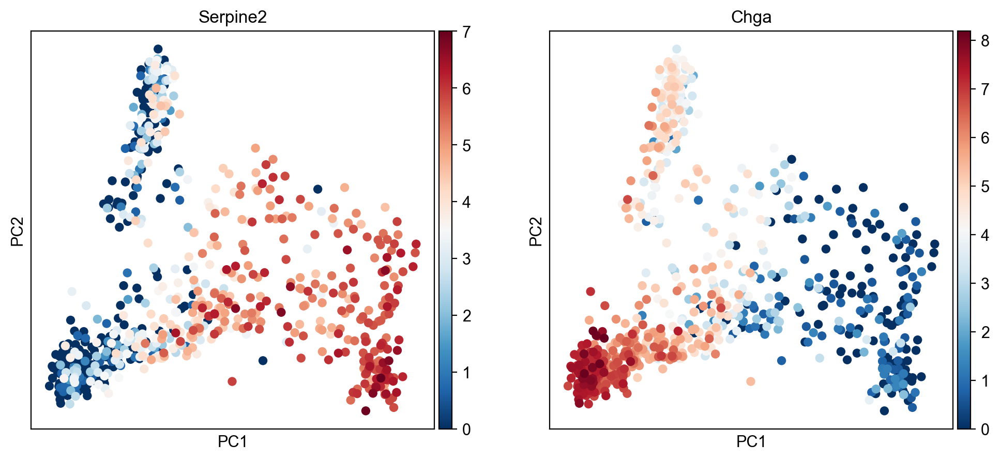

In [15]:
sc.pl.pca(adata, color='leiden_res1', save="pca_leiden_res0_25.png")
genes_of_interest = ['Serpine2', 'Chga']
sc.pl.pca(adata, color=genes_of_interest)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_pca', embedded velocity vectors (adata.obsm)


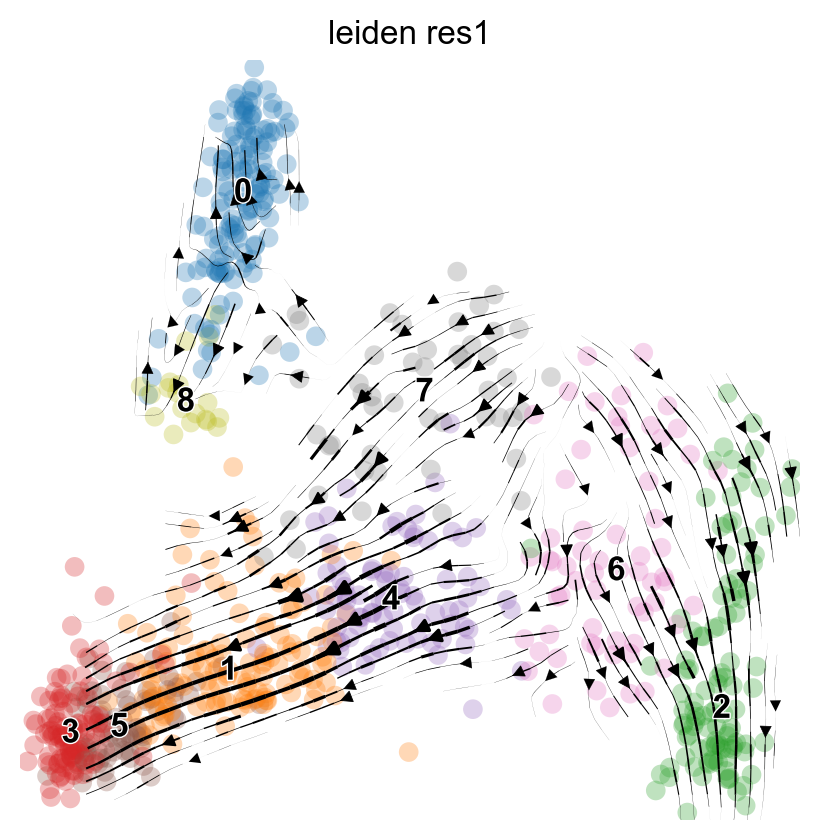

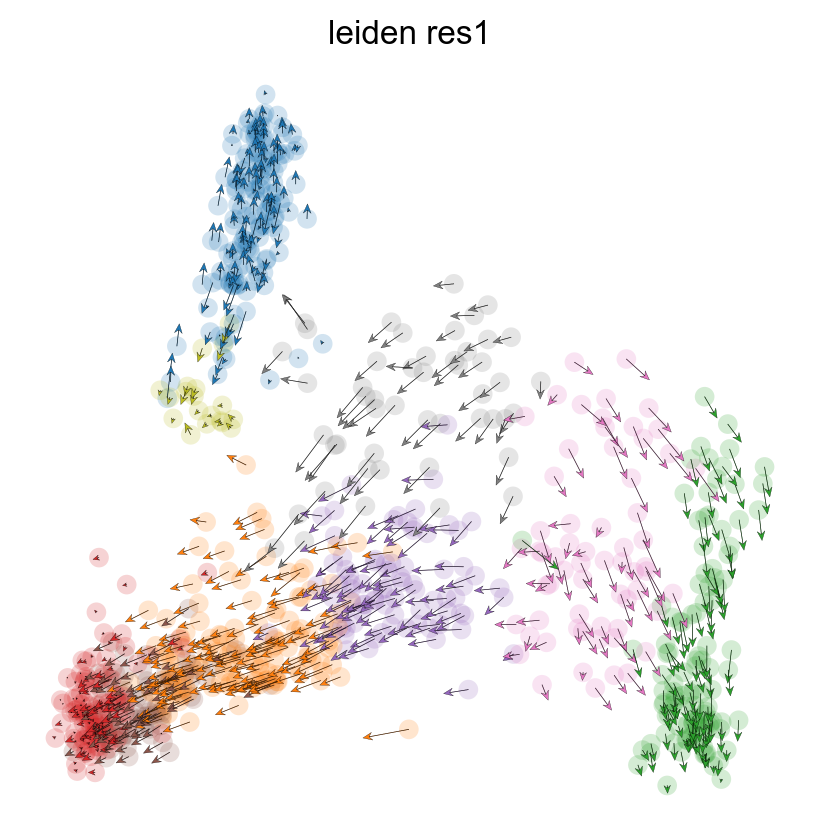

In [16]:
with plt.rc_context({'figure.figsize': (5, 5)}):
    scv.pl.velocity_embedding_stream(
            adata,
            basis='pca', 
            color='leiden_res1', 
            size=200
        )
    
    scv.pl.velocity_embedding(
        adata,
        basis='pca', 
        color='leiden_res1', 
        size=200,
        arrow_length = 4,
        arrow_size = 2
    )

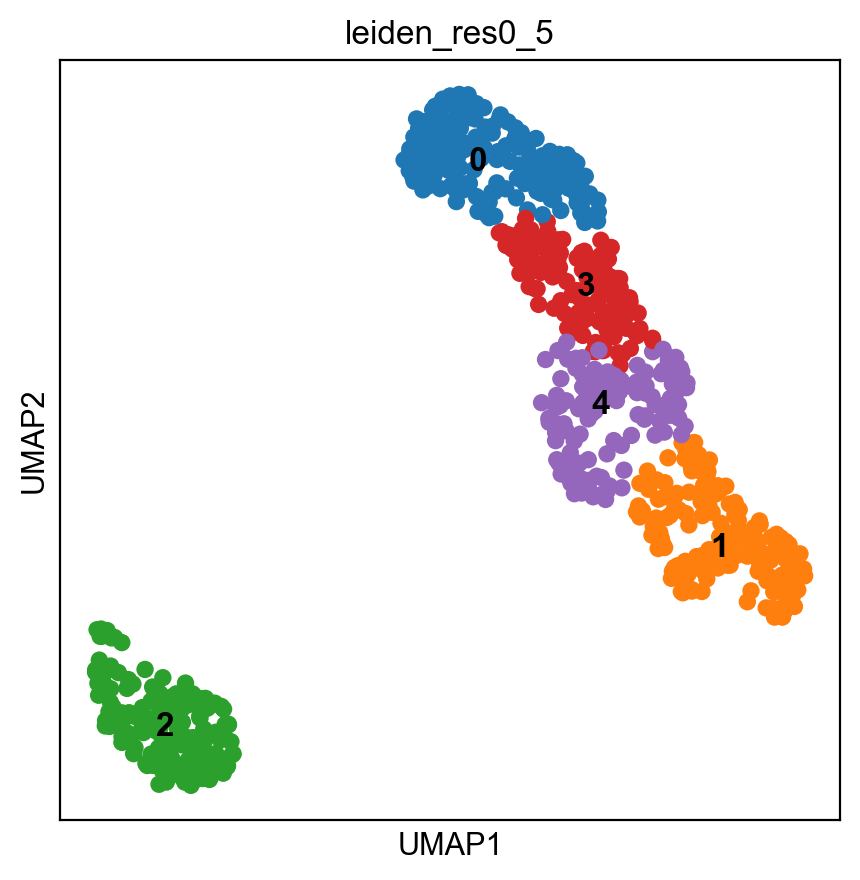

In [17]:
sc.pl.umap(adata, color='leiden_res0_5', legend_loc='on data')

In [18]:
print(adata.var_names)

Index(['Gm37323', 'Ppp1r42', 'Eya1', 'Stau2', 'Eloc', 'Gm16070', 'Pkhd1',
       'Mcm3', 'Tram2', 'Lman2l',
       ...
       'Alg13', 'Rtl4', 'Fam120c', 'Phf8', 'Foxr2', 'Map3k15', 'Adgrg2',
       'Ace2', 'Gpm6b', 'Gm15228'],
      dtype='object', name='Gene', length=2000)


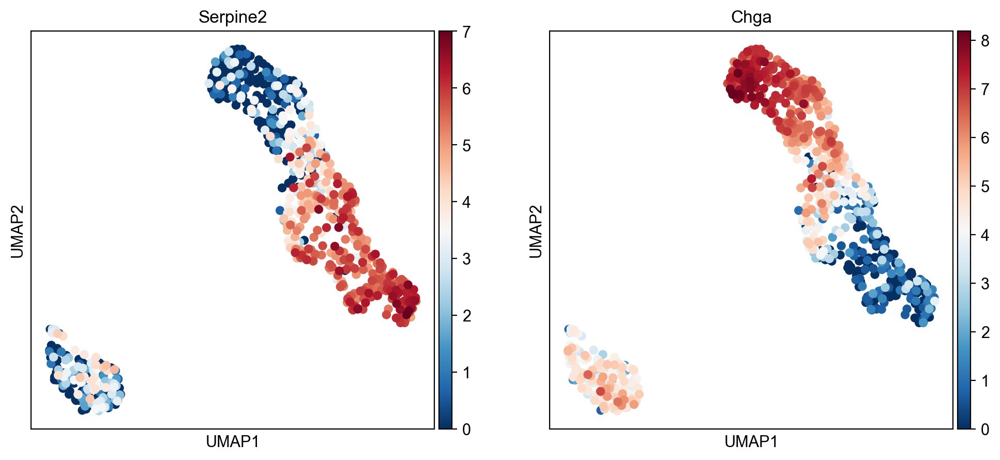

In [19]:
genes_of_interest = ['Serpine2', 'Chga']
sc.pl.umap(adata, color=genes_of_interest)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


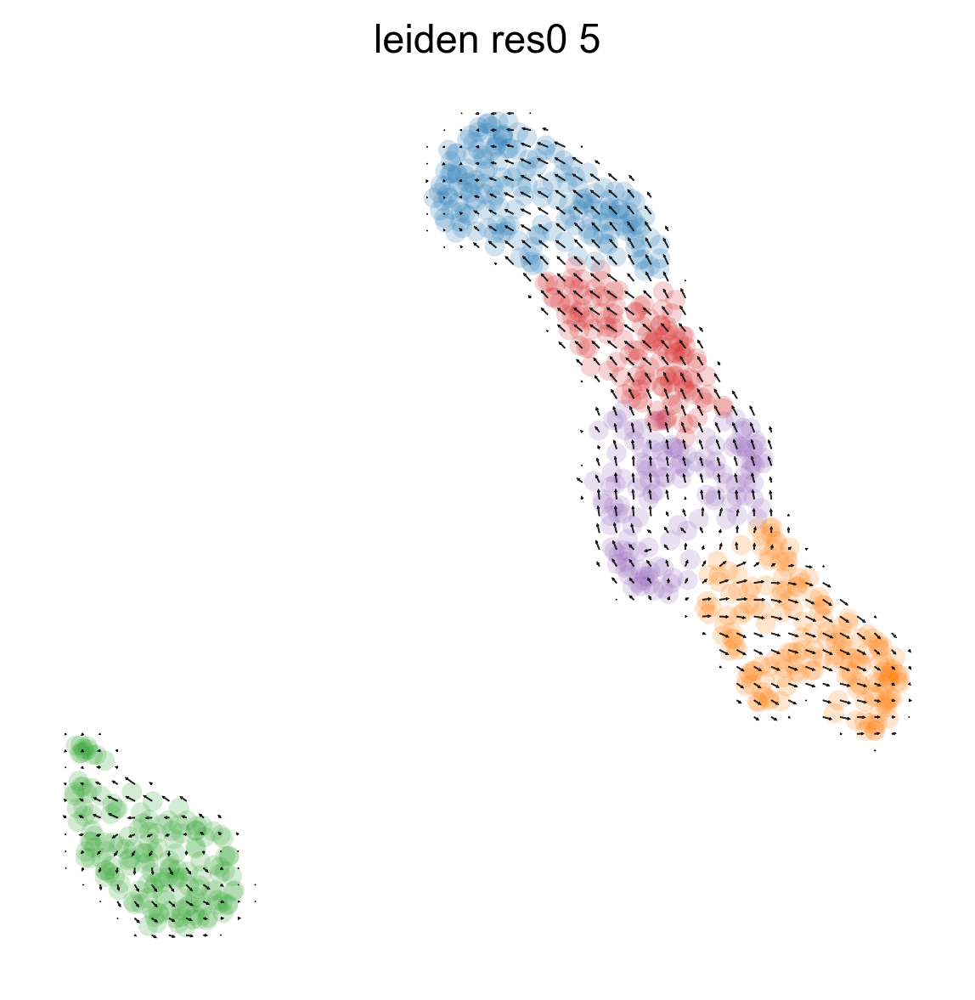

In [20]:
scv.pl.velocity_embedding_grid(
    adata, basis='umap', 
    color='leiden_res0_5', 
    dpi=140, 
    size=150, 
    arrow_size=0.5,
    )

saving figure to file ./figures/scvelo_velocity_genes.png


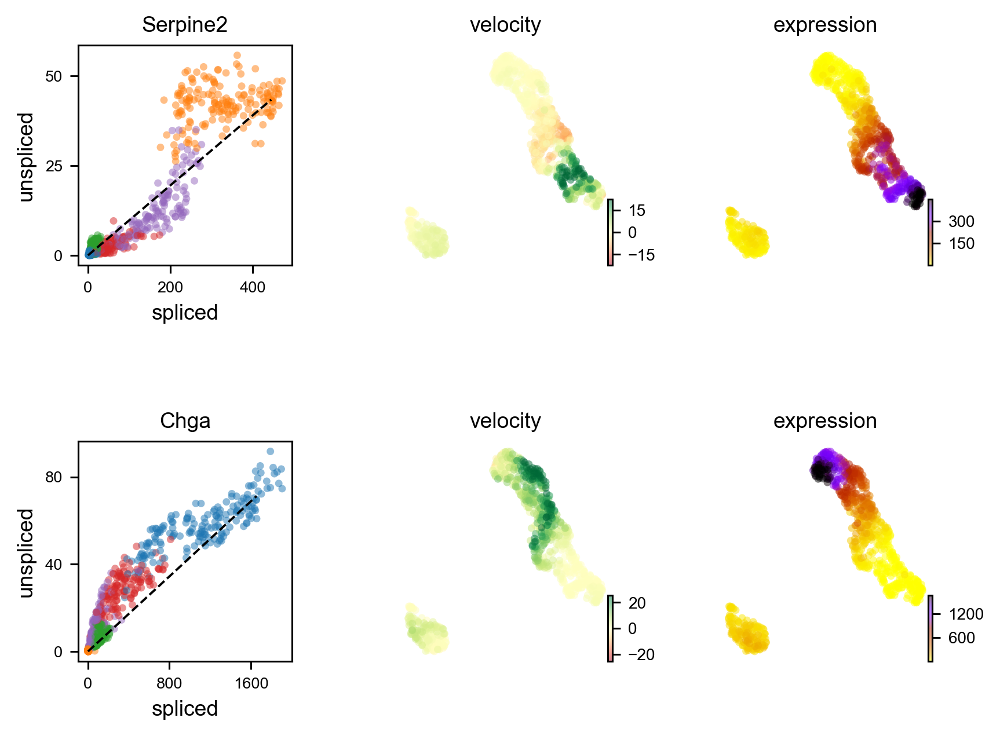

In [21]:
with plt.rc_context({'figure.figsize': (4.5, 5)}):
    scv.pl.velocity(adata, genes_of_interest, ncols=1, color='leiden_res0_5', dpi=140, save = "velocity_genes.png")

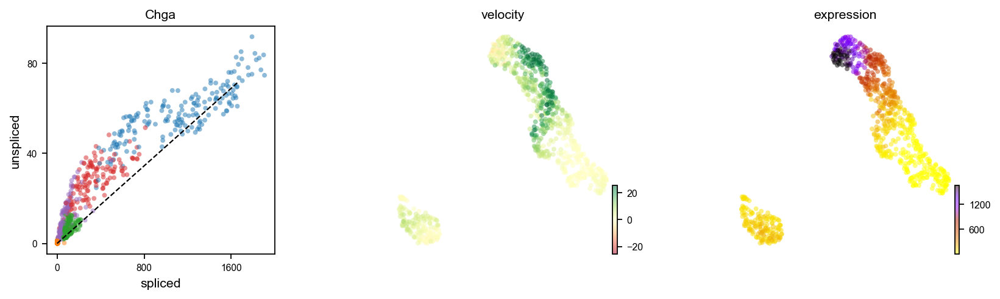

In [22]:
scv.pl.velocity(adata, 'Chga', ncols = 1, color='leiden_res0_5',
                 dpi = 1000, figsize=(6.5, 5),
                 size = 50)


In [23]:
scv.tl.rank_velocity_genes(adata, groupby='leiden', min_corr=.3)

df = scv.get_df(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes


/Users/lumizhang/miniconda3/lib/python3.10/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6,7,8
0,Rgs7,Caln1,Ldb2,Dgkg,Cadps2,Cacna1d,2610035D17Rik,Tbx20,9530059O14Rik
1,Kcnip1,Edil3,Slc35f1,Cdkl2,Sox6,Ppfia2,Zfp462,Sulf1,Hecw1
2,Pde4b,Dgkk,Prickle2,Rit2,Adam23,Meg3,Pik3r1,Brinp3,Kcnk10
3,Rbl1,Sytl4,Dagla,Slc24a2,Atxn7l2,Elf4,Serpine2,Grin3a,Ablim1
4,Nudt10,Nrk,Dnai2,Ncald,Grik3,Th,Sesn3,Btaf1,Pam


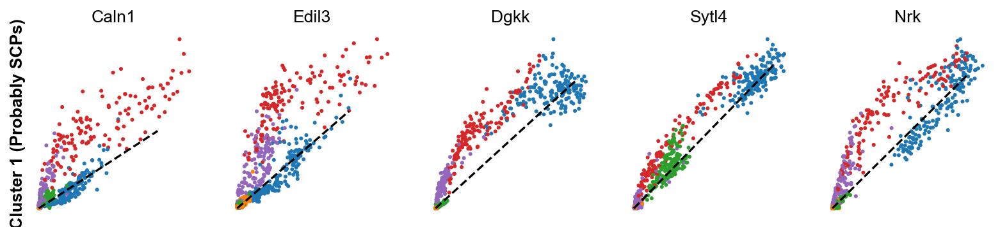

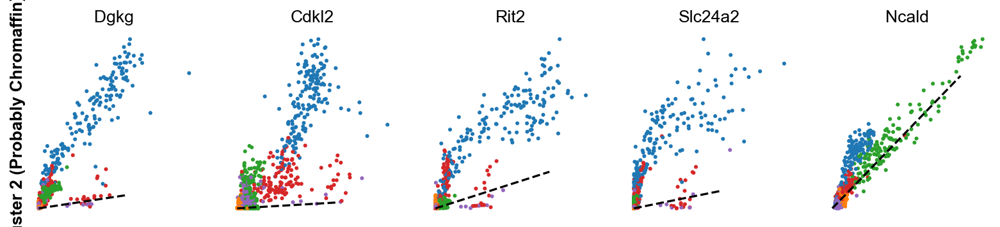

In [24]:
kwargs = dict(frameon = False, size = 30, linewidth = 1.5, color = 'leiden_res0_5')

with plt.rc_context({'figure.figsize': (8, 8)}):
    scv.pl.scatter(adata, df["1"][:5], ylabel="Cluster 1 (Probably SCPs)", **kwargs)
    scv.pl.scatter(adata, df["3"][:5], ylabel="Cluster 2 (Probably Chromaffin)", **kwargs)

computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


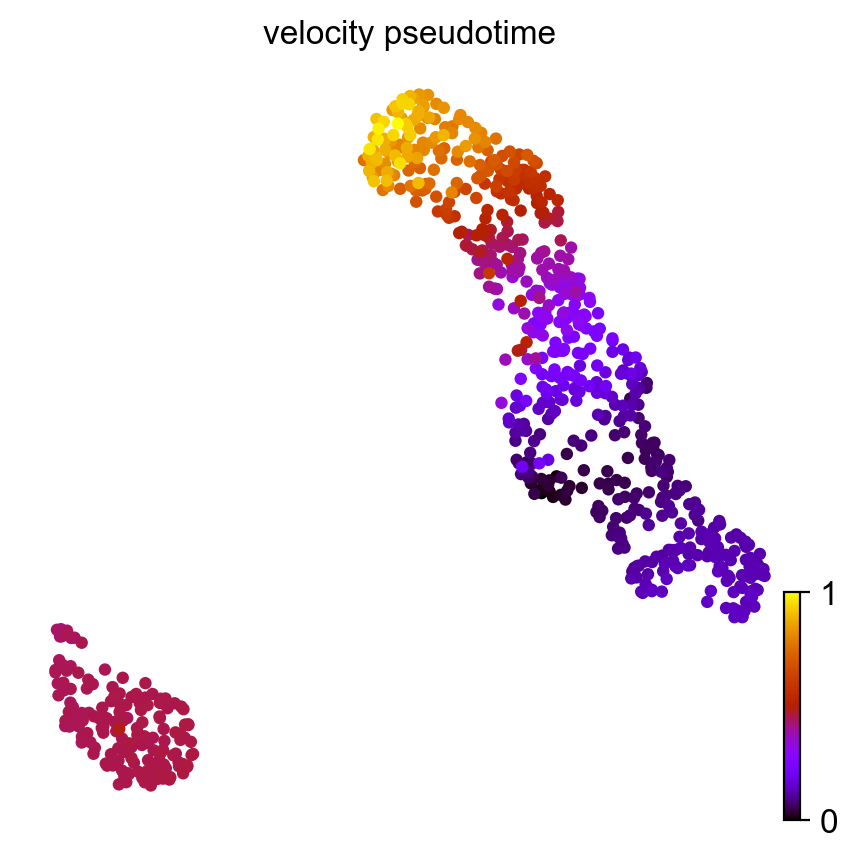

In [25]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', color_map='gnuplot', size=80)

## 
We will then try to annotate our data using the tool celltypist.

In [26]:
# !pip install celltypist

It will not work since celltypist don't have a model for the mouse chromaffin cells. Maybe the original paper will work?

From the [science paper](https://www.science.org/doi/10.1126/science.aal3753) in 2017 by Furlan et al.:
> The SCPs were marked by high levels of Foxd3, Sox10, Plp1, and Erbb3. ERBB3 is a part of the heteromeric receptor complex in glial cells that is necessary for survival and proliferation of SOX10+/PLP1+ SCPs receiving ligand interaction from membrane-anchored neuregulin-1 (NRG1) that is presented by the nerves (23). In the areas poor in NRG1, or after soluble NRG1 is not produced any longer (2), SOX10+ SCPs can maintain their survival and multiply only following the nerve branches that supply them with anchored NRG1. Reiprich et al. showed the presence of the SOX10+ cells in locations where the nerves normally descend to the AM, but the role of the nerve has not been explored (6). Consistently, nerves in the sympathoadrenal area were confirmed to be NRG1+ (fig. S8A). SOX10+ SCPs displayed expression of multiple genes participating in myelination (Pou3f1/Oct6, Sh3tc2, Lgi4, Dhh, Mal, etc.) and other glial cell markers (Fabp7, Mpz—and genes coding for S100β, laminins, Mag) (fig. S8, B to E). The sympathoblasts were distinguished by the presence of Slc18a3 (19) and Cartpt (coding for CART) (4) as well as by broader markers of sympathoadrenal differentiation such as Th, and chromaffin cells were identified by a Th+/Phox2b+/Chgb+/Slc18a3−/Cartpt− signature (Fig. 5, C and H, and fig. S7, B to D) (4).




So first, we check the SCP cells by looking at the expression of Foxd3, Sox10, Plp1, and Erbb3. Unfortunately, Foxd3 can't be found in the feature names of the single-cell data, so we used the 3 genes left to check the cell type.

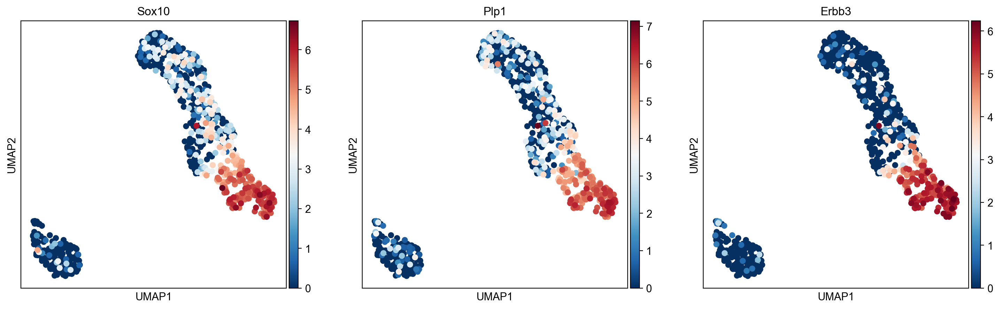

In [27]:
scp_markers = ['Sox10', 'Plp1', 'Erbb3']

sc.pl.umap(adata, color=scp_markers, legend_loc="on data")

Then we check the sympathoblasts by looking at the expression of Slc18a3 and Cartpt.

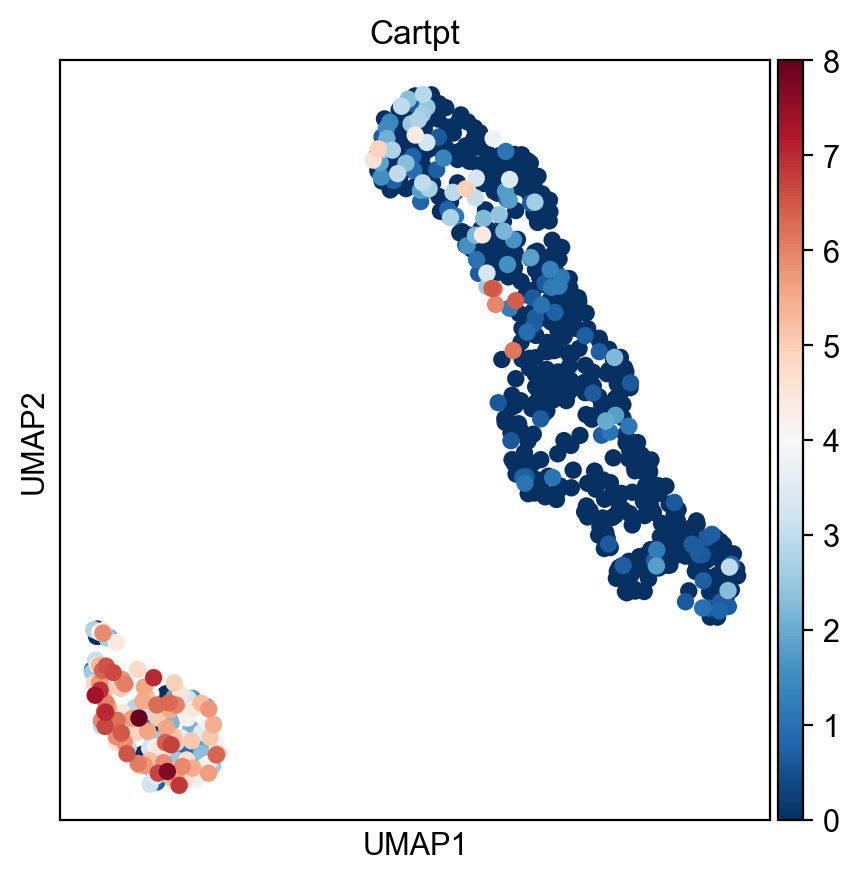

In [28]:
sb_markers = ['Cartpt'] # Slc18a3 is also not found.

sc.pl.umap(adata, color=sb_markers, legend_loc="on data")


Finally, we check the chromaffin cells by looking at the expression of Th, Phox2b, Chgb, Slc18a3, and Cartpt.

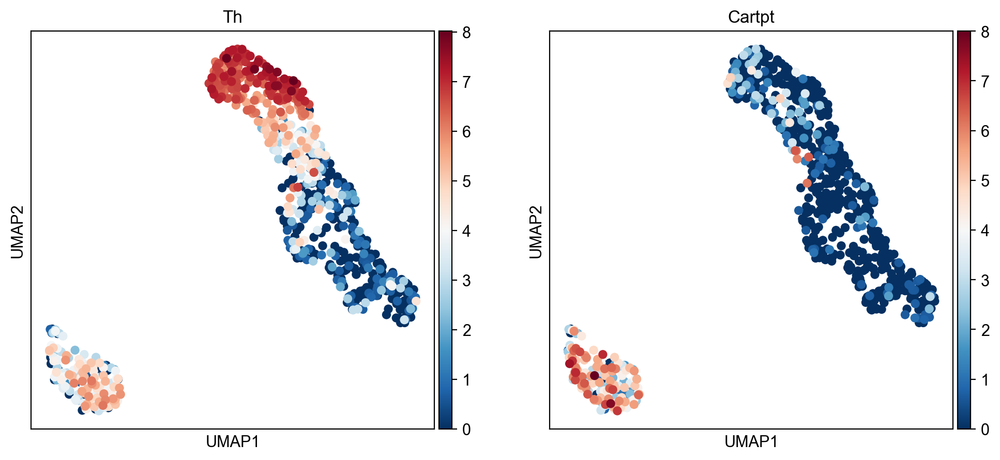

In [29]:
chr_markers = ['Th','Cartpt'] # All that aren't here are not found.

sc.pl.umap(adata, color=chr_markers, legend_loc="on data")

Chr markers:  ['Th', 'Cartpt']
Sb markers:  ['Cartpt']
Scp markers:  ['Sox10', 'Plp1', 'Erbb3']


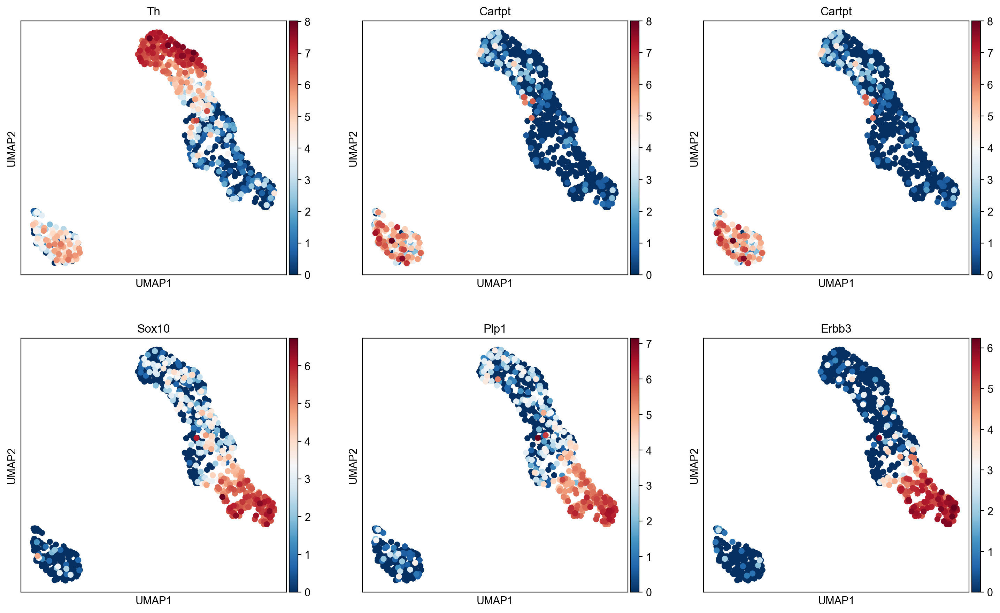

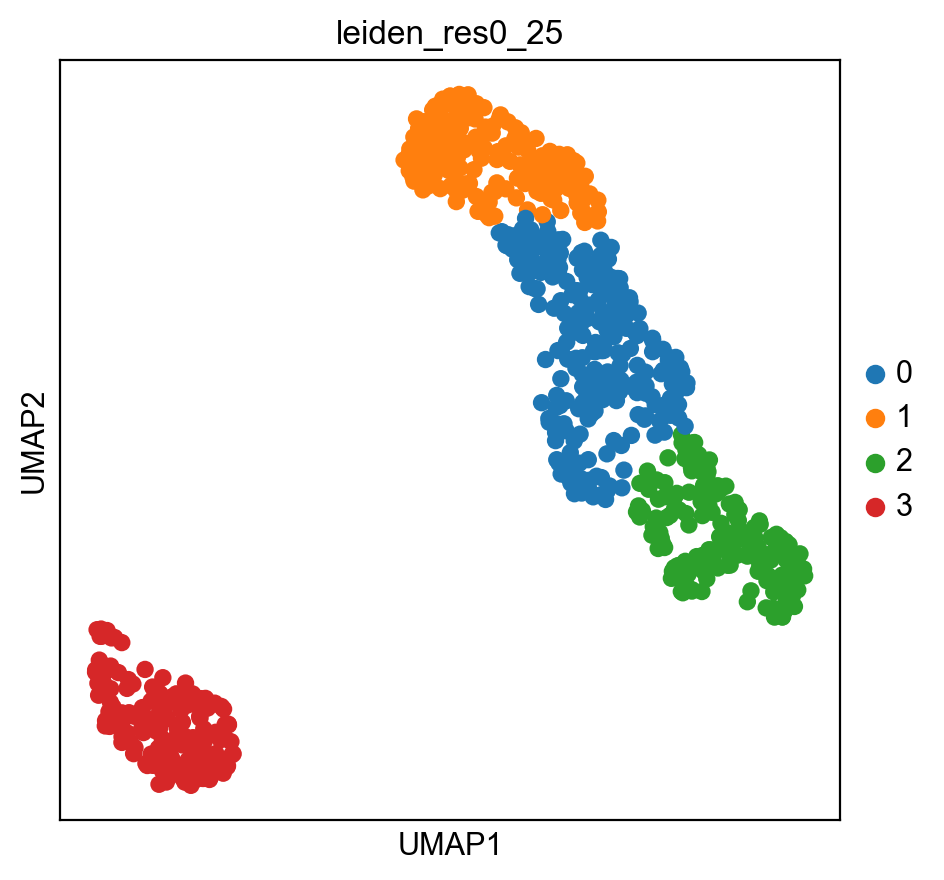

In [30]:
markers = chr_markers + sb_markers + scp_markers
print("Chr markers: ", chr_markers)
print("Sb markers: ", sb_markers)
print("Scp markers: ", scp_markers)

sc.pl.umap(adata, color=markers, legend_loc="on data", ncols=3,
           save="markers.png")
sc.pl.umap(adata, color='leiden_res0_25')

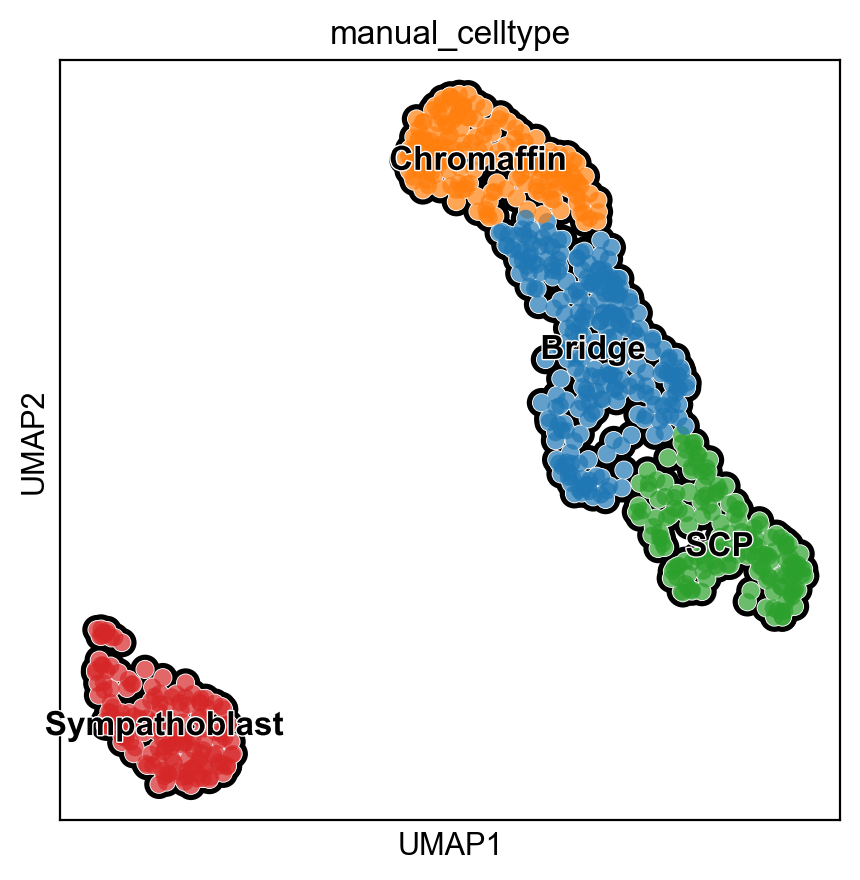

In [31]:
cl_annotation = {
    "2": "SCP",
    "1": "Chromaffin",
    "3": "Sympathoblast",
    "0": "Bridge"
}
adata.obs['manual_celltype'] = adata.obs['leiden_res0_25'].map(cl_annotation)
sc.pl.umap(adata, color='manual_celltype', legend_loc='on data', save="manual_celltype.png", add_outline=True, legend_fontoutline=1)

saving figure to file ./figures/scvelo_velocity_manual_celltype.png


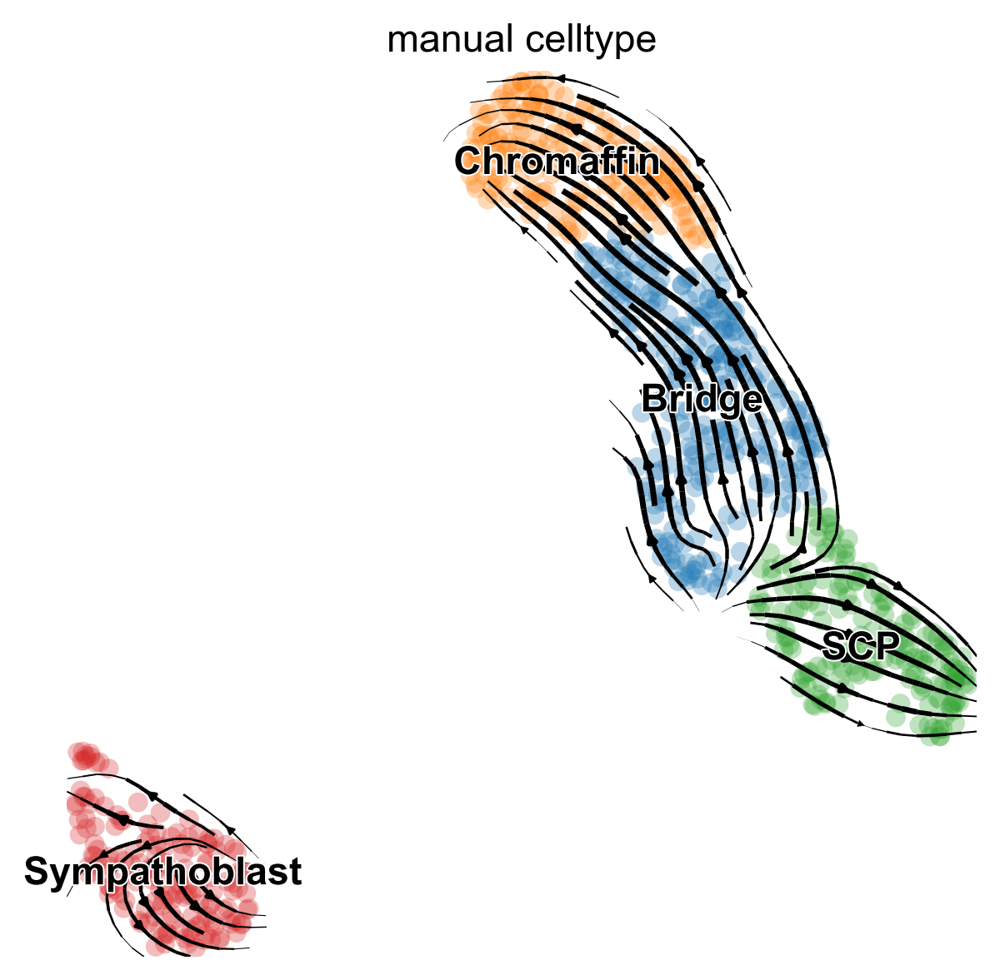

In [32]:
scv.pl.velocity_embedding_stream(
        adata, basis='umap', 
        color='manual_celltype', 
        dpi=140, 
        size=150, 
        arrow_size=0.5,
        save = "velocity_manual_celltype.png",
        #add_outline=True
    )

saving figure to file ./figures/scvelo_velocity_manual_celltype_pca_1_2.png


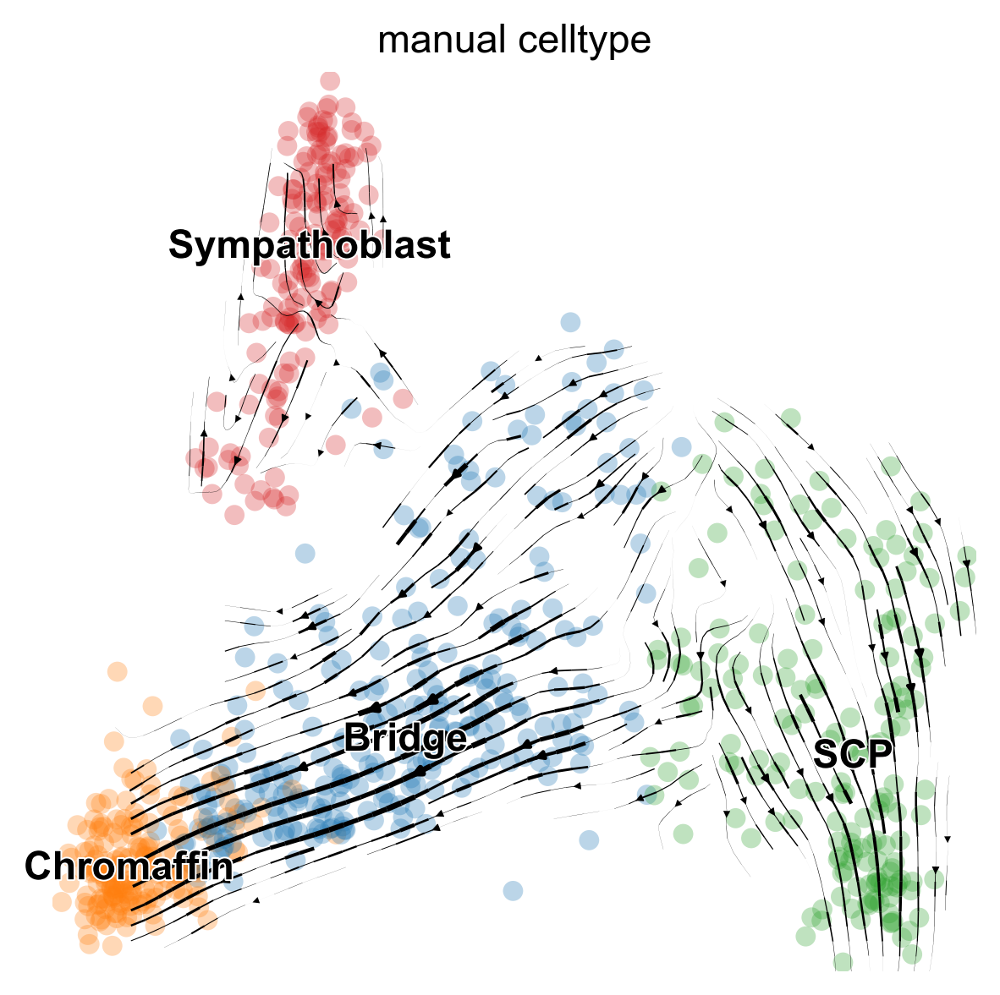

saving figure to file ./figures/scvelo_velocity_manual_celltype_pca_2_3.png


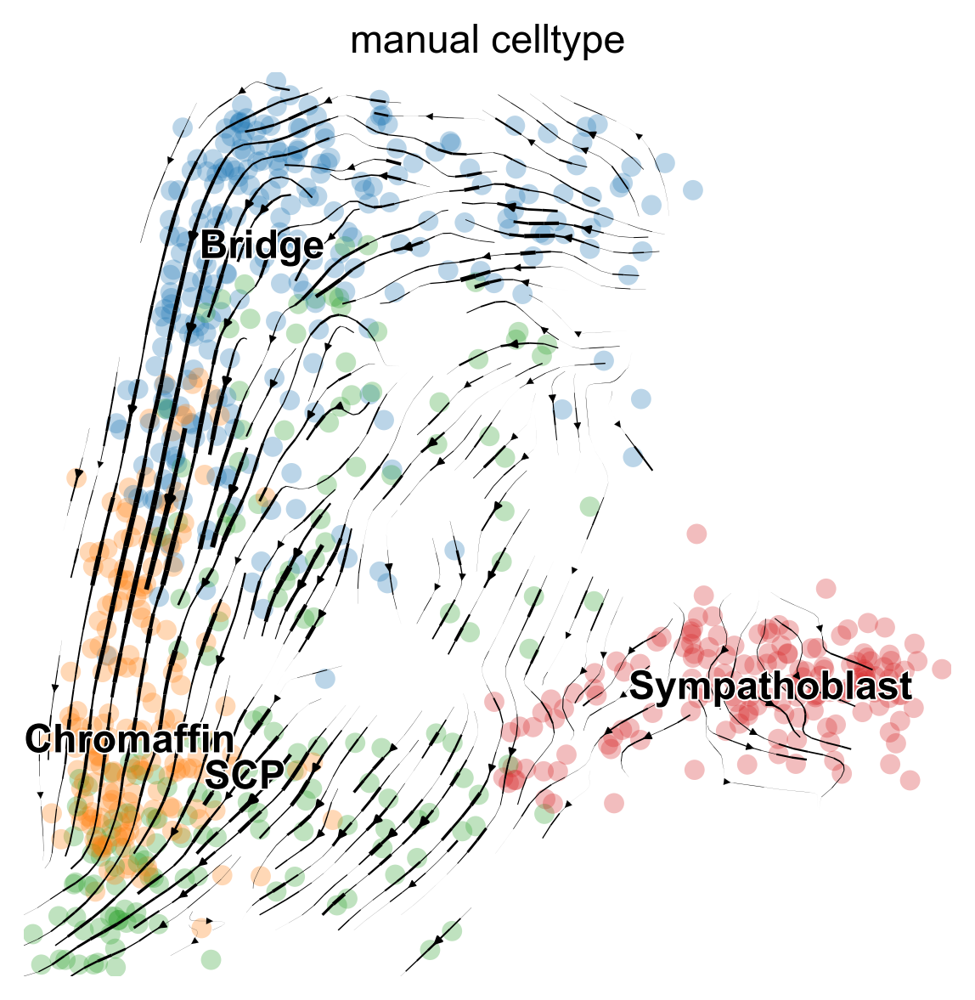

saving figure to file ./figures/scvelo_velocity_manual_celltype_pca_3_4.png


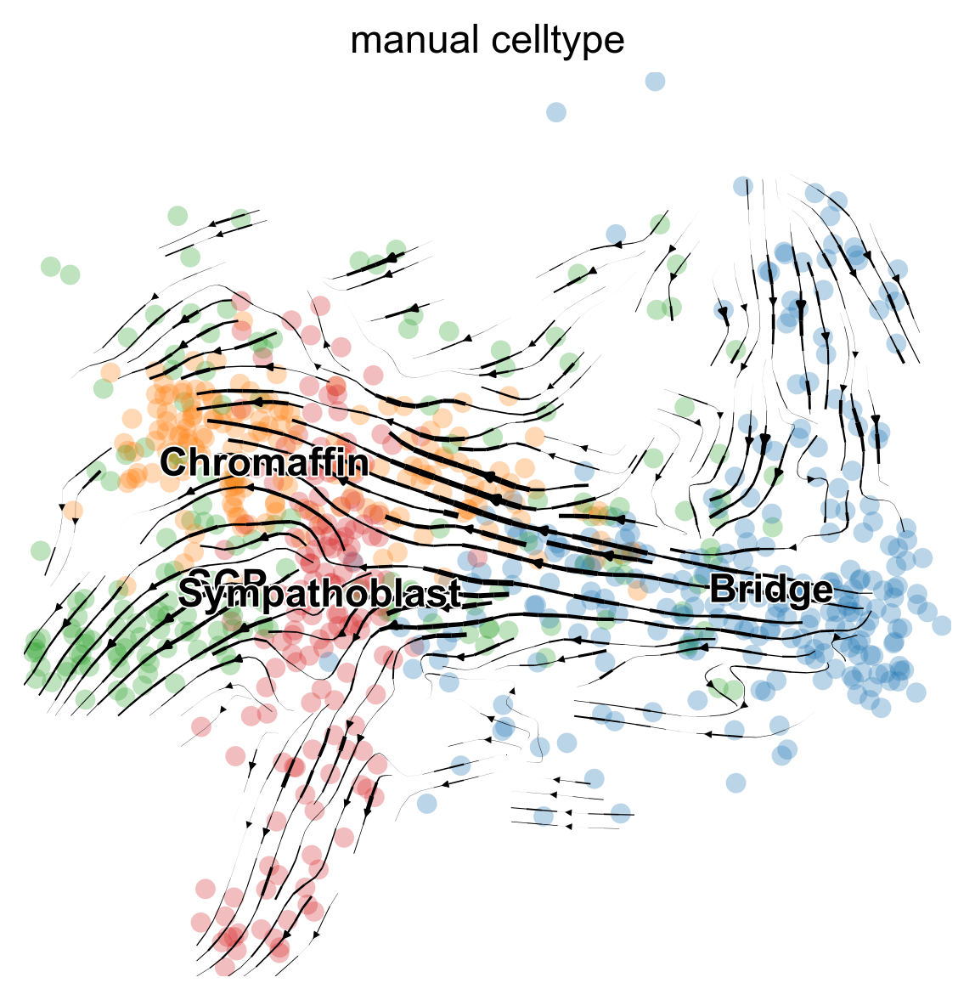

In [33]:
scv.pl.velocity_embedding_stream(
        adata, basis='pca', 
        color='manual_celltype', 
        dpi=140, 
        size=150, 
        arrow_size=0.5,
        components = '1,2',
        save = "velocity_manual_celltype_pca_1_2.png"
)
scv.pl.velocity_embedding_stream(
        adata, basis='pca', 
        color='manual_celltype', 
        dpi=140, 
        size=150, 
        arrow_size=0.5,
        components = '2,3',
        save = "velocity_manual_celltype_pca_2_3.png"
)
scv.pl.velocity_embedding_stream(
        adata, basis='pca', 
        color='manual_celltype', 
        dpi=140, 
        size=150, 
        arrow_size=0.5,
        components = '3,4',
        save = "velocity_manual_celltype_pca_3_4.png"
)

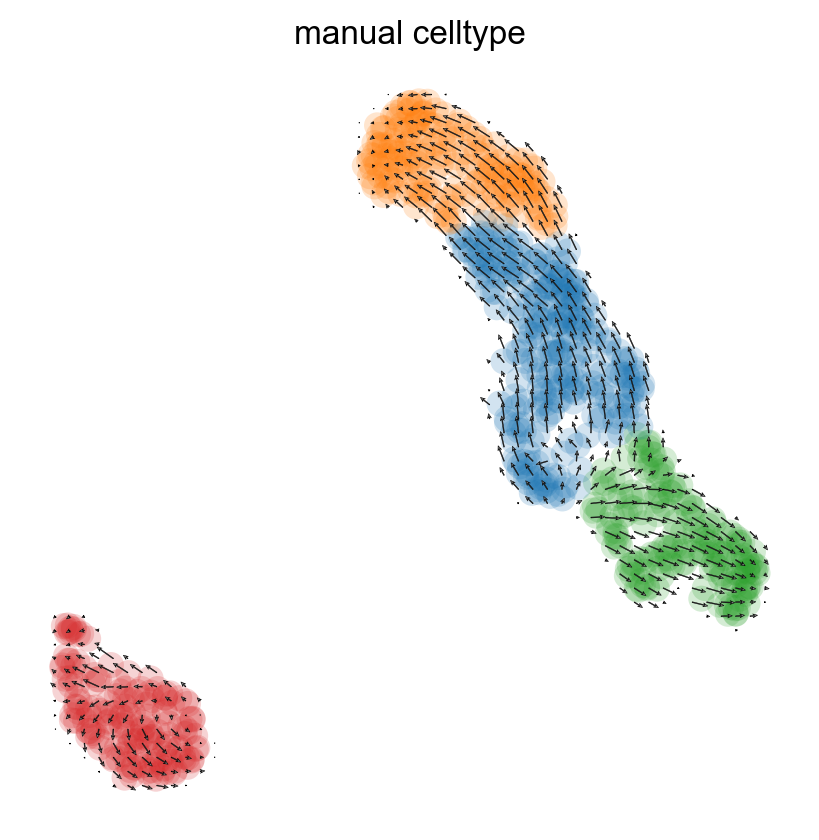

In [34]:
scv.pl.velocity_embedding_grid(
    adata, basis='umap', color='manual_celltype', arrow_length=2
)

Because the flow in the SCP is a bit wierd, we would like to find the cluster gene markers and check their velocity scatter plot.

In [35]:
sc.tl.rank_genes_groups(adata, groupby='manual_celltype', method='wilcoxon')

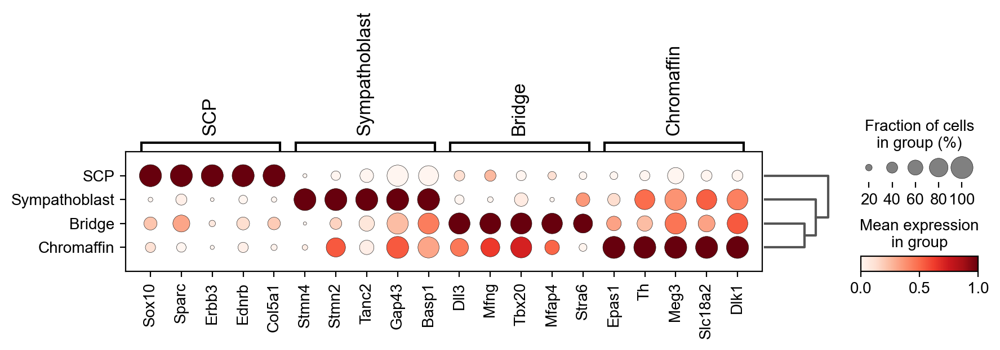

In [36]:
sc.pl.rank_genes_groups_dotplot(
    adata, 
    groupby='manual_celltype', 
    n_genes=5, 
    standard_scale='var',
    save = "velocity_manual_celltype_rank_genes_groups_dotplot.png"
)

In [37]:
scp_genes = sc.get.rank_genes_groups_df(adata, group='SCP').head(5)["names"]
sb_genes = sc.get.rank_genes_groups_df(adata, group='Sympathoblast').head(5)["names"]
chr_genes = sc.get.rank_genes_groups_df(adata, group='Chromaffin').head(5)["names"]
brg_genes = sc.get.rank_genes_groups_df(adata, group='Bridge').head(5)["names"]

saving figure to file ./figures/scvelo_scp_genes.png


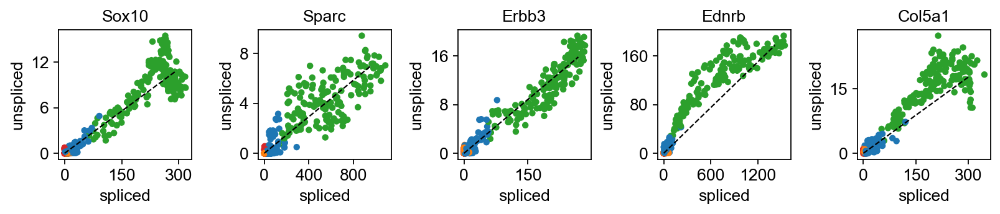

saving figure to file ./figures/scvelo_sb_genes.png


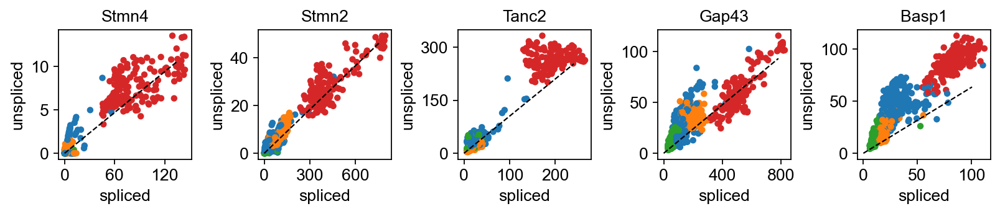

saving figure to file ./figures/scvelo_chr_genes.png


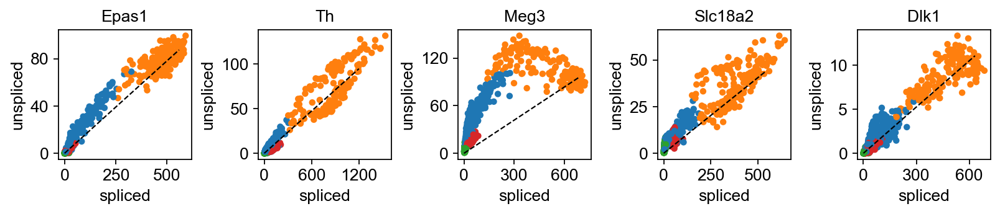

saving figure to file ./figures/scvelo_brg_genes.png


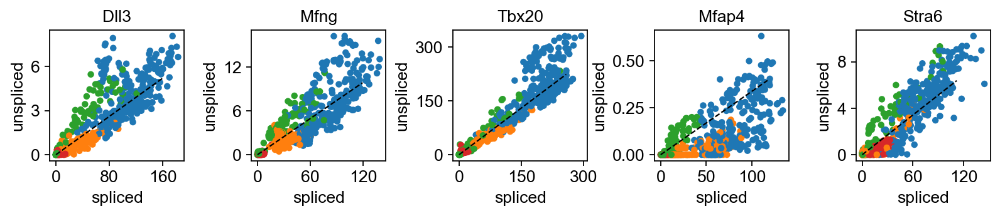

In [38]:
scv.set_figure_params('scvelo', figsize=(5,5), dpi=140)
kwargs = dict(wspace=0.5, figsize=(7,5), color='manual_celltype', ncols=5)
scv.pl.scatter(adata, scp_genes, save = "scp_genes.png", **kwargs)
scv.pl.scatter(adata, sb_genes, save = "sb_genes.png", **kwargs)
scv.pl.scatter(adata, chr_genes, save = "chr_genes.png", **kwargs)
scv.pl.scatter(adata, brg_genes, save = "brg_genes.png", **kwargs)

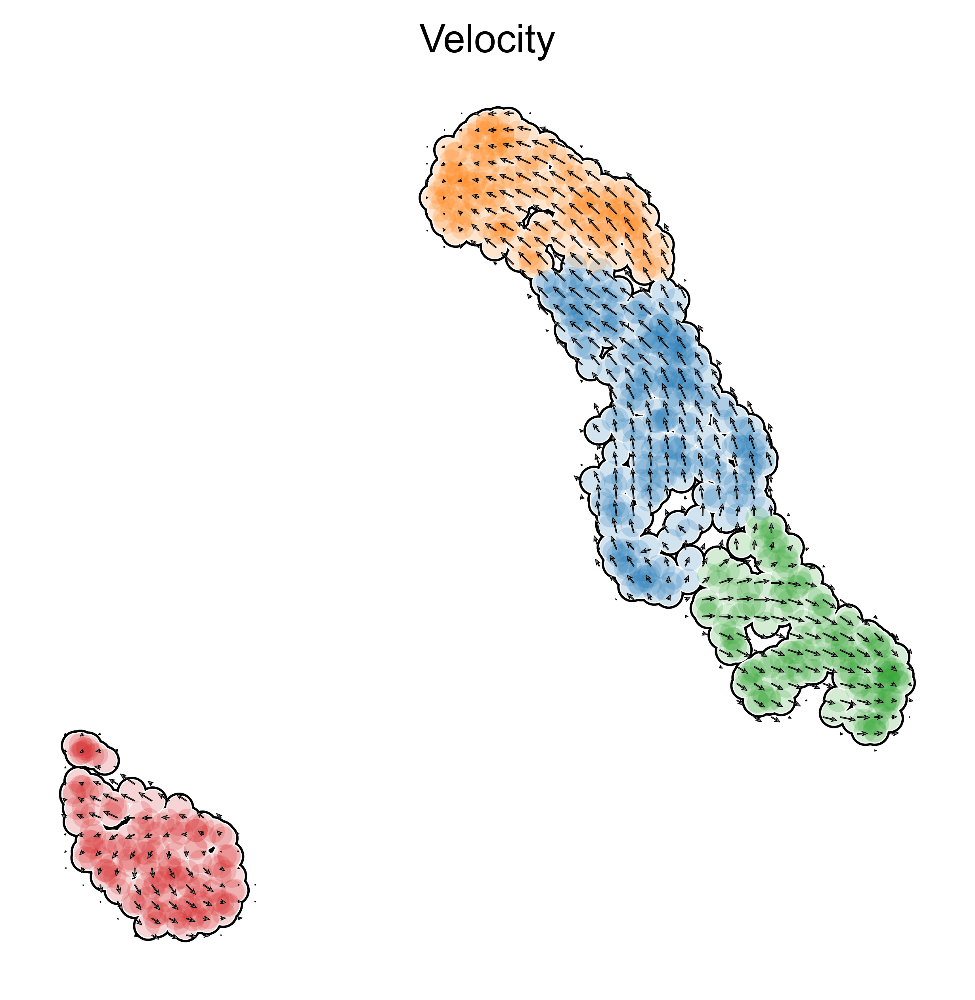

In [39]:
# Plots for review paper fig1
scv.pl.velocity_embedding_grid(
        adata, basis='umap', 
        color='manual_celltype', 
        dpi=300, 
        arrow_size=1,
        add_outline=True,
        size =200,
        outline_width = (0.1,0.05),
        smooth = 0.5,
        arrow_length = 1.5,
        scale = 1.2,
        title = "Velocity"
    )

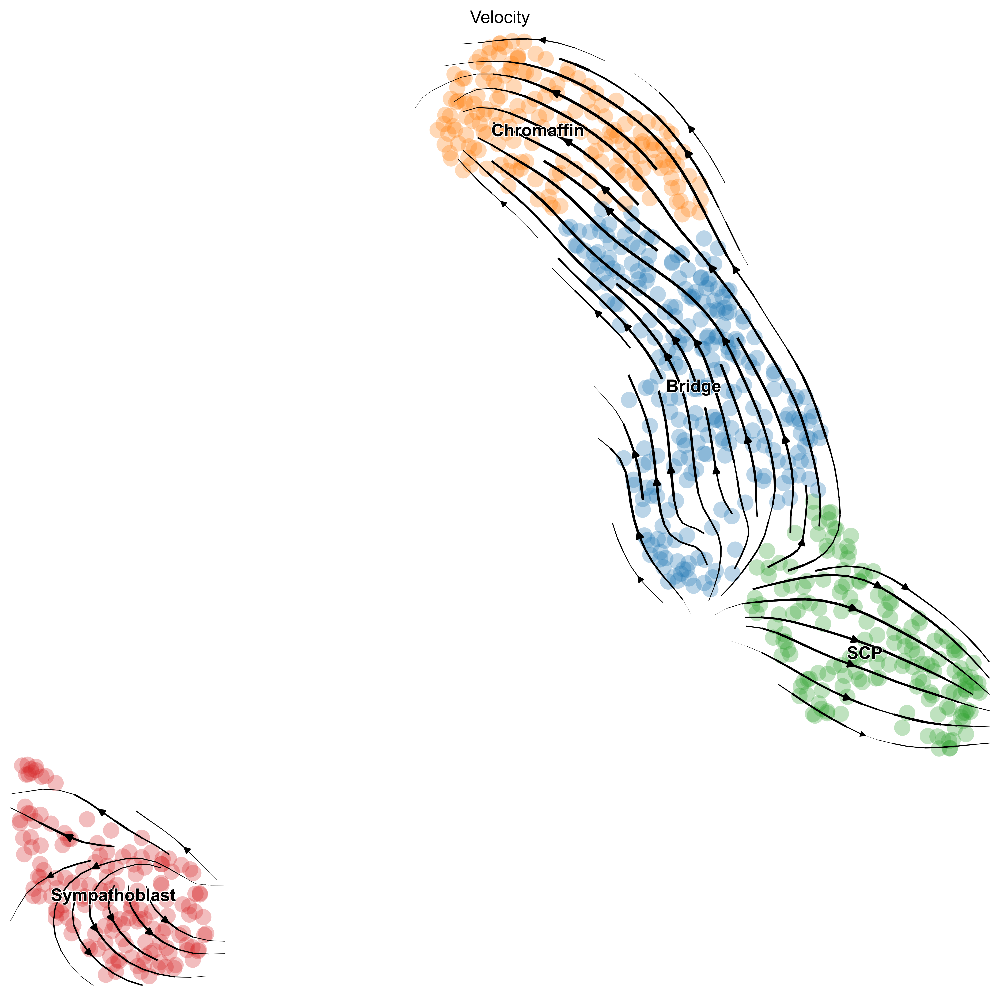

In [57]:
scv.pl.velocity_embedding_stream(
        adata, basis='umap',
        color = 'manual_celltype',
        size = 500,
        dpi = 300,
        title = 'Velocity',
        figsize = (7,7),)

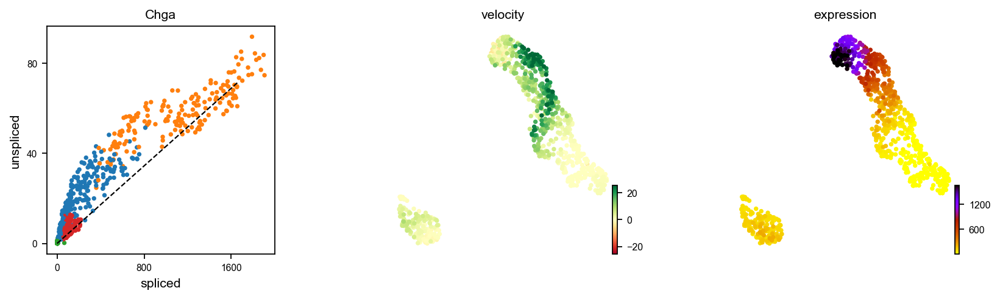

In [58]:
scv.pl.velocity(adata, 'Chga', ncols = 1, color='manual_celltype',
                 dpi = 1000, figsize=(6.5, 5),
                 alpha = 1)

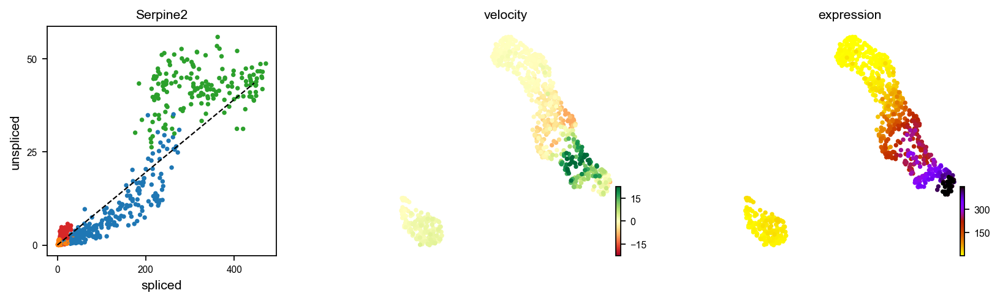

In [59]:
scv.pl.velocity(adata, 'Serpine2', ncols = 1, color='manual_celltype',
                 dpi = 1000, figsize=(6.5, 5),
                 alpha = 1)

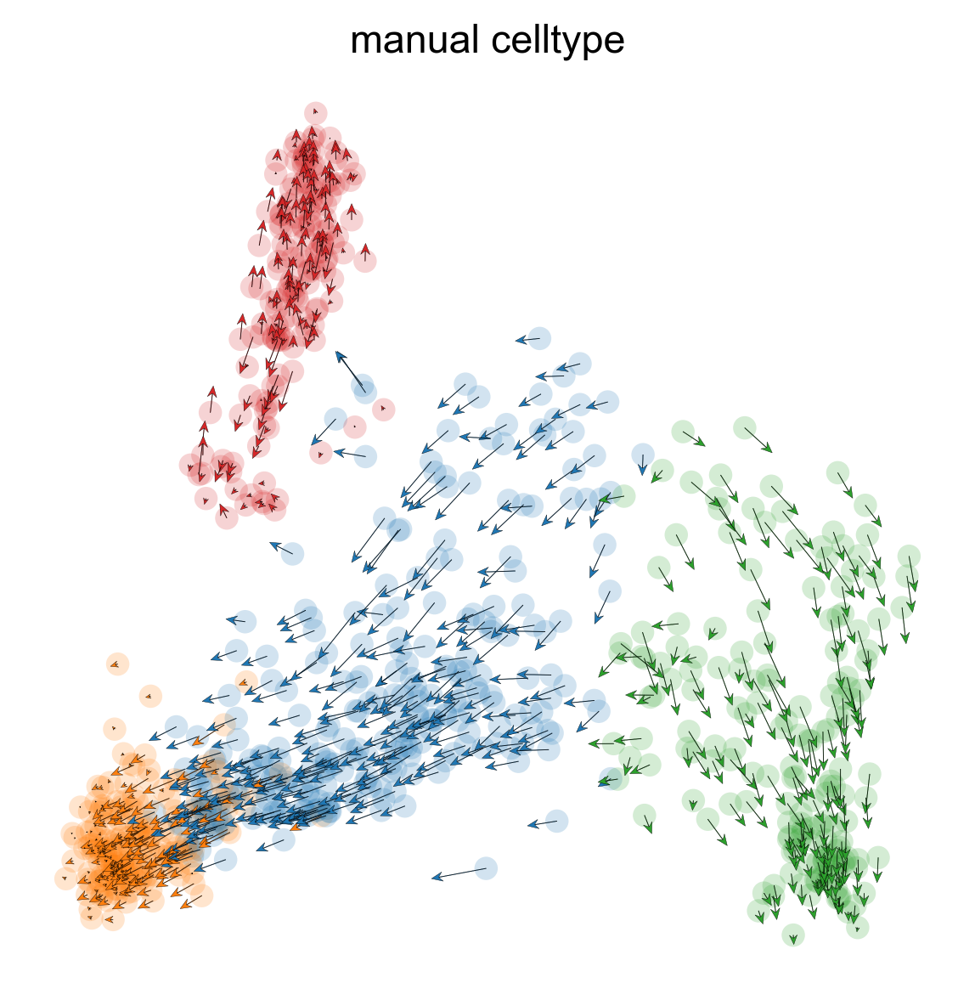

In [60]:
scv.pl.velocity_embedding(
    adata,
    basis='pca', 
    color='manual_celltype', 
    size=200,
    arrow_length = 4,
    arrow_size = 2
)